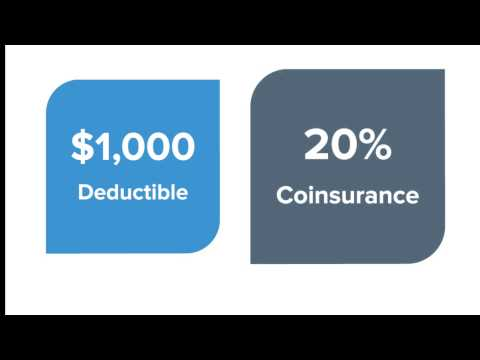

In [17]:
from IPython.display import YouTubeVideo
YouTubeVideo(id="hdtQPawYm2k",width=1000,height=500)

In [18]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [19]:
import pandas as pd  
import numpy as np
import joblib 
import operator
import seaborn as sns
import plotly.express as px 
from plotly.subplots import make_subplots 
import plotly.graph_objects as go  
from matplotlib import pyplot as plt
import warnings 
warnings.filterwarnings("ignore")

In [20]:
from sklearn.metrics import precision_score 
from sklearn.metrics import recall_score 
from sklearn.metrics import f1_score 
from sklearn.metrics import roc_auc_score

In [21]:
# For metrics Calculation 
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import mean_squared_error 
from sklearn.metrics import classification_report  
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve 
from sklearn.metrics import auc

In [22]:
from sklearn.model_selection import train_test_split #splitting train and testing data 
from sklearn.model_selection import cross_val_score 
from sklearn.linear_model import LogisticRegression # to build a model that will be able to classify the response is 1 or 0 based on input attributes
from sklearn.model_selection import  StratifiedKFold,KFold # for splitting the data into five parts  
from sklearn.preprocessing import LabelEncoder # for labeling some of the categorical Variables i.e 0,1,2,3.....

In [23]:
df=pd.read_csv("https://raw.githubusercontent.com/benvictoria21/pandas/master/dataset/Health%20Insurance%20Cross%20Sell%20Prediction/test.csv") 
df1=pd.read_csv("https://raw.githubusercontent.com/benvictoria21/pandas/master/dataset/Health%20Insurance%20Cross%20Sell%20Prediction/train.csv")

In [24]:
print("Shape of training dataset") 
print("=================================================")
print("Number of rows :"+str(df.shape[0])) 
print("Number of columns : "+str(df.shape[1]))

Shape of training dataset
Number of rows :127037
Number of columns : 11


In [25]:
print("shape of testing data set")  
print("=======================================")
print("Number of rows :"+str(df1.shape[0])) 
print("Number of columns : "+str(df1.shape[1]))

shape of testing data set
Number of rows :381109
Number of columns : 12


In [26]:
Gender=df["Gender"].value_counts().to_frame().reset_index().rename(columns={'index':'Gender',"Gender":'Count'})

<a id="1"></a>
<h1 style='background:purple; color:white'><center>Uni Variate Analysis<center><h1>

In [27]:
fig=go.Figure(go.Bar(x=Gender["Gender"],y=Gender["Count"],text=Gender["Count"],textposition="outside")) 
fig.update_layout(title="Gender") 
fig.show()

In [28]:
fig=px.pie(df,names="Gender",title="Gender",hole=0.4,color_discrete_map={'Male':'royalblue','Female':'blue'}) 
fig.show()

In [29]:
fig=px.histogram(df,x="Age",nbins=50,title="Distribution of Ages") 
fig.show()

In [30]:
fig=px.pie(df,names="Driving_License",title="Driving_License",hole=0.3) 
fig.show()

In [31]:
fig=px.pie(df,names="Previously_Insured",title="Previously_insured",hole=0.8) 
fig.show()

In [32]:
fig=px.pie(df,names="Vehicle_Damage",title="Vehicle Damage",hole=0.3,color_discrete_sequence=["springgreen","aqua"])
fig.show()

In [33]:
fig=px.pie(df,names="Vehicle_Age",title="Vehicle_Age",hole=0.7,color_discrete_sequence=["royalblue","blue","green"]) 
fig.show()

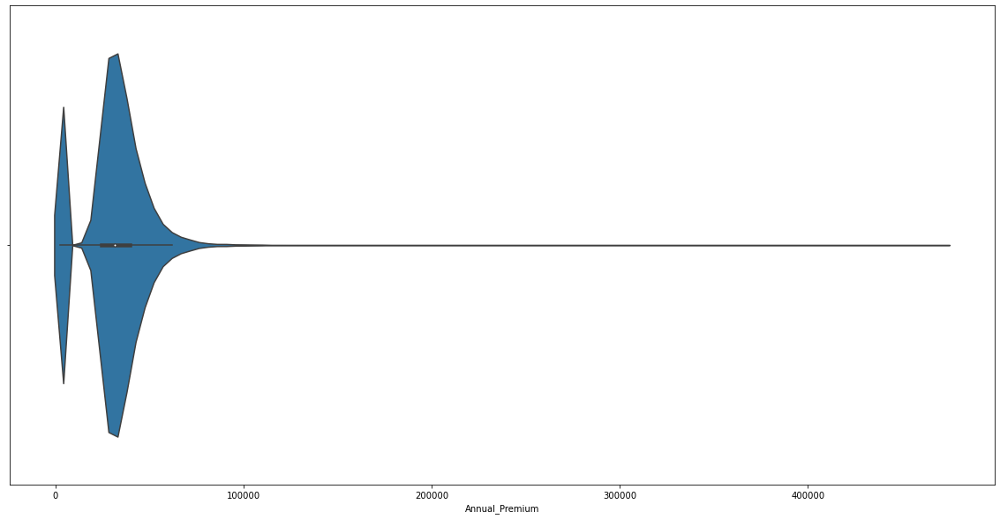

In [34]:
plt.figure(figsize=(20,10))
sns.violinplot(df["Annual_Premium"])

In [35]:
Driving=df.groupby(["Gender","Driving_License"])["Driving_License"].count().unstack("Driving_License") 
Driving

Driving_License,0,1
Gender,,
Female,67,58734
Male,170,68066


Text(0.5, 1.0, 'Difference having Gender whose having Driving License or not')

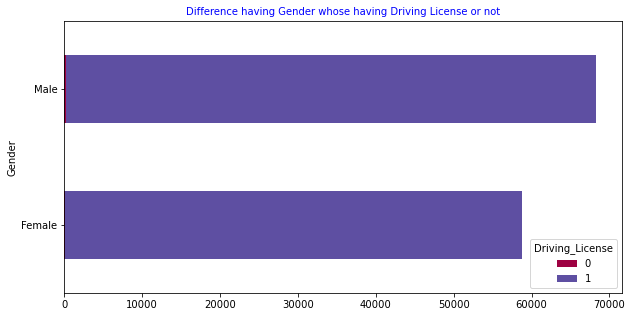

In [36]:
#plotting the graph betweeen gender and driving_license i.e having male and female having license or not 
Driving.plot(kind="barh",stacked=True,figsize=(10,5),colormap="Spectral") 
plt.title("Difference having Gender whose having Driving License or not",color="blue",fontsize=10,loc="center")

In [37]:
Vehicle_Age=df.groupby(["Gender","Vehicle_Age"])["Vehicle_Age"].count().unstack("Vehicle_Age")
Vehicle_Age

Vehicle_Age,1-2 Year,< 1 Year,> 2 Years
Gender,,,
Female,26071,30829,1901
Male,40628,24190,3418


Text(0.5, 1.0, 'Gender comparision With Vehicle Age')

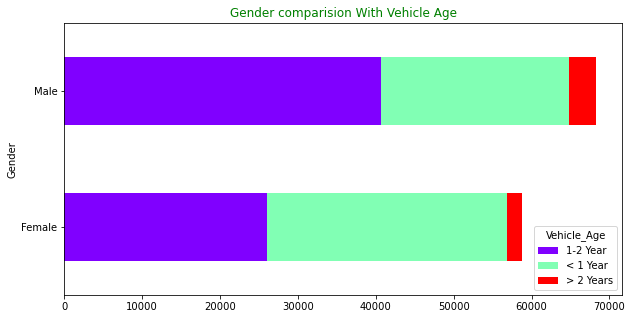

In [38]:
#Here We can see the bar chart between gender with respective Vehicle Age 
Vehicle_Age.plot(kind="barh",stacked=True,figsize=(10,5),fontsize=10,colormap="rainbow") 
plt.title("Gender comparision With Vehicle Age",color="green")

In [39]:
Vehicle_damage=df.groupby(["Gender","Vehicle_Damage"])["Vehicle_Damage"].count().unstack("Vehicle_Damage")

Text(0.5, 1.0, 'Gender comparision with Vehicle_damage i.e caused by accident or not ')

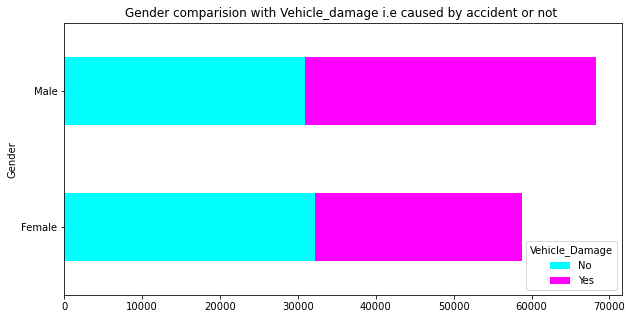

In [40]:
Vehicle_damage.plot(kind="barh",stacked=True,figsize=(10,5),colormap="cool") 
plt.title("Gender comparision with Vehicle_damage i.e caused by accident or not ")

In [42]:
Response.plot(kind="barh",stacked=True,figsize=(10,5),colormap="Set1")

NameError: name 'Response' is not defined

In [43]:
Previously_insured=df.groupby(["Gender","Previously_Insured"])["Previously_Insured"].count().unstack("Previously_Insured") 
Previously_insured

Previously_Insured,0,1
Gender,,
Female,29064,29737
Male,39531,28705


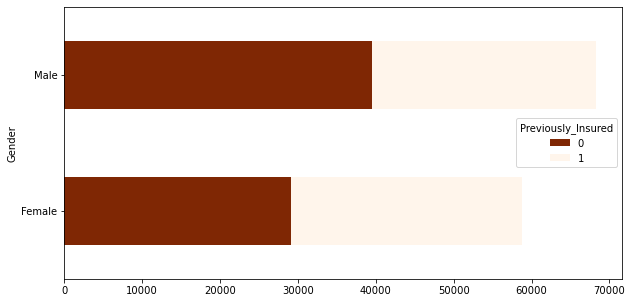

In [44]:
Previously_insured.plot(kind="barh",stacked=True,figsize=(10,5),colormap="Oranges_r")

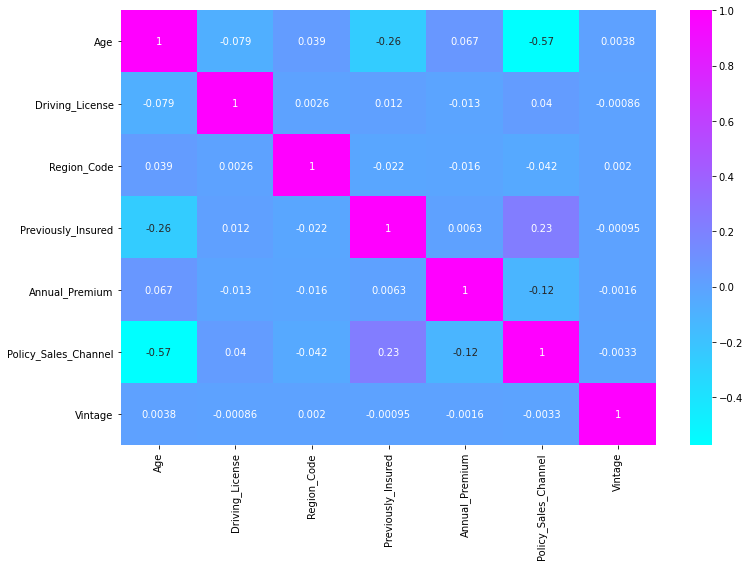

In [45]:
plt.figure(figsize=(12,8)) 
sns.heatmap(df.drop("id",axis=1).corr(),annot=True,cmap="cool")